### Geopy

In [2]:
%load_ext autoreload
%autoreload 2

In [ ]:
# https://pypi.org/project/geopy/

In [1]:
import pandas as pd

In [3]:
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="google")
location = geolocator.geocode("175 5th Avenue NYC")

In [4]:
location

Location(Flatiron Building, 175, 5th Avenue, Flatiron District, Manhattan Community Board 5, Manhattan, New York County, New York, Stone Street Historic District, New York, 10010, United States of America, (40.741059199999995, -73.98964162240998, 0.0))

In [5]:
location.address

'Flatiron Building, 175, 5th Avenue, Flatiron District, Manhattan Community Board 5, Manhattan, New York County, New York, Stone Street Historic District, New York, 10010, United States of America'

In [6]:
location[-1]

(40.741059199999995, -73.98964162240998)

In [9]:
geolocator.geocode('16 villa gaudelet')

Location(16, Villa Gaudelet, Quartier Saint-Ambroise, Paris 11e Arrondissement, Paris, Île-de-France, France métropolitaine, 75011, France, (48.8649224, 2.3800903, 0.0))

In [11]:
print((location.latitude, location.longitude))

(40.741059199999995, -73.98964162240998)


In [12]:
print(location.raw)

{'place_id': 155546647, 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. https://osm.org/copyright', 'osm_type': 'way', 'osm_id': 264768896, 'boundingbox': ['40.7407566', '40.7413004', '-73.9898715', '-73.9895014'], 'lat': '40.741059199999995', 'lon': '-73.98964162240998', 'display_name': 'Flatiron Building, 175, 5th Avenue, Flatiron District, Manhattan Community Board 5, Manhattan, New York County, New York, Stone Street Historic District, New York, 10010, United States of America', 'class': 'tourism', 'type': 'attraction', 'importance': 0.7405988542685404, 'icon': 'https://nominatim.openstreetmap.org/ui/mapicons//poi_point_of_interest.p.20.png'}


In [14]:
geolocator.geocode('153 rue parmentier')

Location(Parmentier, Avenue de la République, Quartier de la Folie-Méricourt, Paris 11e Arrondissement, Paris, Île-de-France, France métropolitaine, 75011, France, (48.8653786, 2.3739112, 0.0))

### Measuring Distance

#### geodesic distance

In [10]:
from geopy.distance import geodesic

In [19]:
lewagon_gaudelet = (48.8649224, 2.3800903, 0.0)

In [17]:
alice_paris = (48.8653786, 2.3739112, 0.0)

In [25]:
result = geodesic(alice_paris,lewagon_gaudelet).miles

In [26]:
print(result)

0.2834601898275353


In [30]:
# 1 mi = 1.609344 km

result_km = result * 1.609344 
print(f'distance from le wagon to Alice House: {result_km} km')

distance from le wagon to Alice House: 0.456184955737805 km


#### Using great-circle distance:

In [21]:
from geopy.distance import great_circle

In [23]:
print(great_circle(lewagon_gaudelet , alice_paris).miles)

0.2826154935343465


### GEOPANDAS

In [3]:
from minority_report.clean_data import CleanData

In [11]:
import pickle
pickle_path = ('../raw_data/clean.pickle')
with open(pickle_path, 'rb') as f:
    df = pickle.load(f)
    

In [12]:
df.head()

,precinct_number,offense_type,crime_completed,offense_level,premise_desc,premise,jurisdiction,park_name,suspect_age,suspect_race,suspect_sex,latitude,longitude,metro,victim_age,victim_race,victim_sex,period,borough,patrol_borough
0,73,OFFENSES AGAINST PUBLIC ADMINI,COMPLETED,MISDEMEANOR,INSIDE,RESIDENCE - PUBLIC HOUSING,N.Y. HOUSING POLICE,NOT PARK,25-44,BLACK,M,40.664239,-73.908425,NOT SUBWAY,<18,BLACK,M,2015-02-11 15:00:00,BROOKLYN,PATROL BORO BKLYN NORTH
1,69,ASSAULT 3 & RELATED OFFENSES,COMPLETED,MISDEMEANOR,INSIDE,RESIDENCE-HOUSE,N.Y. POLICE DEPT,NOT PARK,UNKNOWN,UNKNOWN,UNKNOWN,40.644590,-73.892672,NOT SUBWAY,45-64,BLACK,F,2012-03-17 10:00:00,BROOKLYN,PATROL BORO BKLYN SOUTH
2,71,HARRASSMENT 2,COMPLETED,VIOLATION,INSIDE,PUBLIC SCHOOL,N.Y. POLICE DEPT,NOT PARK,<18,BLACK,M,40.658758,-73.942435,NOT SUBWAY,18-24,BLACK,M,2016-10-27 13:00:00,BROOKLYN,PATROL BORO BKLYN SOUTH
3,112,RAPE,COMPLETED,FELONY,INSIDE,RESIDENCE - APT. HOUSE,N.Y. POLICE DEPT,NOT PARK,25-44,WHITE HISPANIC,M,40.722364,-73.851474,NOT SUBWAY,25-44,WHITE,F,2014-11-27 19:00:00,QUEENS,PATROL BORO QUEENS NORTH
4,24,GRAND LARCENY,COMPLETED,FELONY,INSIDE,DOCTOR/DENTIST OFFICE,N.Y. POLICE DEPT,NOT PARK,UNKNOWN,UNKNOWN,UNKNOWN,40.793465,-73.968950,NOT SUBWAY,45-64,WHITE,F,2013-12-11 13:00:00,MANHATTAN,PATROL BORO MAN NORTH


In [19]:
df.shape

(6416137, 20)

In [20]:
df_geopandas = df[:100].copy()

In [21]:
df_geopandas

,precinct_number,offense_type,crime_completed,offense_level,premise_desc,premise,jurisdiction,park_name,suspect_age,suspect_race,suspect_sex,latitude,longitude,metro,victim_age,victim_race,victim_sex,period,borough,patrol_borough
0,73,OFFENSES AGAINST PUBLIC ADMINI,COMPLETED,MISDEMEANOR,INSIDE,RESIDENCE - PUBLIC HOUSING,N.Y. HOUSING POLICE,NOT PARK,25-44,BLACK,M,40.664239,-73.908425,NOT SUBWAY,<18,BLACK,M,2015-02-11 15:00:00,BROOKLYN,PATROL BORO BKLYN NORTH
1,69,ASSAULT 3 & RELATED OFFENSES,COMPLETED,MISDEMEANOR,INSIDE,RESIDENCE-HOUSE,N.Y. POLICE DEPT,NOT PARK,UNKNOWN,UNKNOWN,UNKNOWN,40.644590,-73.892672,NOT SUBWAY,45-64,BLACK,F,2012-03-17 10:00:00,BROOKLYN,PATROL BORO BKLYN SOUTH
2,71,HARRASSMENT 2,COMPLETED,VIOLATION,INSIDE,PUBLIC SCHOOL,N.Y. POLICE DEPT,NOT PARK,<18,BLACK,M,40.658758,-73.942435,NOT SUBWAY,18-24,BLACK,M,2016-10-27 13:00:00,BROOKLYN,PATROL BORO BKLYN SOUTH
3,112,RAPE,COMPLETED,FELONY,INSIDE,RESIDENCE - APT. HOUSE,N.Y. POLICE DEPT,NOT PARK,25-44,WHITE HISPANIC,M,40.722364,-73.851474,NOT SUBWAY,25-44,WHITE,F,2014-11-27 19:00:00,QUEENS,PATROL BORO QUEENS NORTH
4,24,GRAND LARCENY,COMPLETED,FELONY,INSIDE,DOCTOR/DENTIST OFFICE,N.Y. POLICE DEPT,NOT PARK,UNKNOWN,UNKNOWN,UNKNOWN,40.793465,-73.968950,NOT SUBWAY,45-64,WHITE,F,2013-12-11 13:00:00,MANHATTAN,PATROL BORO MAN NORTH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,90,PETIT LARCENY,COMPLETED,MISDEMEANOR,FRONT OF,STREET,N.Y. POLICE DEPT,NOT PARK,UNKNOWN,UNKNOWN,U,40.712779,-73.964269,NOT SUBWAY,UNKNOWN,UNKNOWN,M,2014-09-26 21:00:00,BROOKLYN,PATROL BORO BKLYN NORTH
96,114,BURGLARY,COMPLETED,FELONY,INSIDE,RESIDENCE - APT. HOUSE,N.Y. POLICE DEPT,NOT PARK,UNKNOWN,UNKNOWN,U,40.770199,-73.924771,NOT SUBWAY,25-44,ASIAN / PACIFIC ISLANDER,F,2015-05-11 07:00:00,QUEENS,PATROL BORO QUEENS NORTH
97,94,BURGLARY,COMPLETED,FELONY,INSIDE,RESIDENCE - APT. HOUSE,N.Y. POLICE DEPT,NOT PARK,UNKNOWN,UNKNOWN,UNKNOWN,40.735982,-73.954085,NOT SUBWAY,45-64,WHITE HISPANIC,M,2016-09-08 09:00:00,BROOKLYN,PATROL BORO BKLYN NORTH
98,34,ASSAULT 3 & RELATED OFFENSES,COMPLETED,MISDEMEANOR,INSIDE,RESIDENCE - APT. HOUSE,N.Y. POLICE DEPT,NOT PARK,UNKNOWN,UNKNOWN,UNKNOWN,40.854031,-73.928475,NOT SUBWAY,25-44,WHITE HISPANIC,F,2013-04-12 23:00:00,MANHATTAN,PATROL BORO MAN NORTH


In [14]:
import geopandas as gpd

In [22]:
from geopandas import GeoDataFrame
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(df_geopandas.longitude, df_geopandas.latitude)]
df_geopandas = df_geopandas.drop(['longitude', 'latitude'], axis=1)
gdf = GeoDataFrame(df_geopandas, crs="EPSG:4326", geometry=geometry)

In [23]:
gdf.head()

,precinct_number,offense_type,crime_completed,offense_level,premise_desc,premise,jurisdiction,park_name,suspect_age,suspect_race,suspect_sex,metro,victim_age,victim_race,victim_sex,period,borough,patrol_borough,geometry
0,73,OFFENSES AGAINST PUBLIC ADMINI,COMPLETED,MISDEMEANOR,INSIDE,RESIDENCE - PUBLIC HOUSING,N.Y. HOUSING POLICE,NOT PARK,25-44,BLACK,M,NOT SUBWAY,<18,BLACK,M,2015-02-11 15:00:00,BROOKLYN,PATROL BORO BKLYN NORTH,POINT (-73.90843 40.66424)
1,69,ASSAULT 3 & RELATED OFFENSES,COMPLETED,MISDEMEANOR,INSIDE,RESIDENCE-HOUSE,N.Y. POLICE DEPT,NOT PARK,UNKNOWN,UNKNOWN,UNKNOWN,NOT SUBWAY,45-64,BLACK,F,2012-03-17 10:00:00,BROOKLYN,PATROL BORO BKLYN SOUTH,POINT (-73.89267 40.64459)
2,71,HARRASSMENT 2,COMPLETED,VIOLATION,INSIDE,PUBLIC SCHOOL,N.Y. POLICE DEPT,NOT PARK,<18,BLACK,M,NOT SUBWAY,18-24,BLACK,M,2016-10-27 13:00:00,BROOKLYN,PATROL BORO BKLYN SOUTH,POINT (-73.94243 40.65876)
3,112,RAPE,COMPLETED,FELONY,INSIDE,RESIDENCE - APT. HOUSE,N.Y. POLICE DEPT,NOT PARK,25-44,WHITE HISPANIC,M,NOT SUBWAY,25-44,WHITE,F,2014-11-27 19:00:00,QUEENS,PATROL BORO QUEENS NORTH,POINT (-73.85147 40.72236)
4,24,GRAND LARCENY,COMPLETED,FELONY,INSIDE,DOCTOR/DENTIST OFFICE,N.Y. POLICE DEPT,NOT PARK,UNKNOWN,UNKNOWN,UNKNOWN,NOT SUBWAY,45-64,WHITE,F,2013-12-11 13:00:00,MANHATTAN,PATROL BORO MAN NORTH,POINT (-73.96895 40.79346)


In [28]:
import matplotlib.pyplot as plt

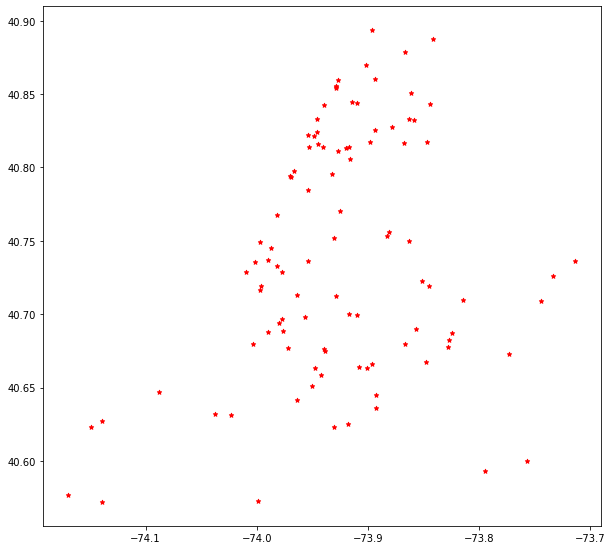

In [34]:
#plot some latitude and longitudes on the map of NYC (sample of 100 crimes)
fig,ax = plt.subplots(figsize = (10,10))
g = gdf.plot(ax = ax, markersize = 20, color = 'red',marker = '*',label = 'NYC')
plt.show()

In [ ]:
# -every hour is an image
# -every image will become a tensor (in pixels)
# -pass the kernel gaussien dans chaque tensor

#X une obs = 24 h = 24 images
# Y 3h after = 3 images


In [36]:
from datetime import datetime
def group_by_hour(df, year, month, day):
    '''
    get a sample of a month-time crimes grouped by hour
    inputs = start_date info
    '''
    sample = df.data[['period', 'latitude', 'longitude']]
    inf = sample['period'] > datetime(year, month, day, 0, 0, 0)
    next_month = month+1
    next_year = year
    if month == 12:
        next_month = 1
        next_year = year+1
    print(next_year, next_month)
    sup = sample['period'] < datetime(next_year, next_month, day, 0, 0, 0)
    sample = sample[ inf & sup ]
    liste = np.sort(np.array(sample['period'].unique()))
    grouped = []
    length = len(liste)
    for index, timestamp in enumerate(liste):
        if (index+1) % 10 ==0:
            print(f'Grouping timestamp {index+1}/{length}')
        by_hour = np.array(sample[sample['period']== timestamp][['latitude', 'longitude']])
        grouped.append(by_hour) 
    lat_per_image = [[element[0] for element in crime] for crime in grouped]
    lon_per_image = [[element[1] for element in crime] for crime in grouped]
    return lat_per_image, lon_per_image

In [ ]:
# Using function group by hour df

In [79]:
import pandas as pd
sample = df.copy()[['period', 'latitude', 'longitude']]
year = 2016
month = 12
day = 17
inf = sample['period'] > datetime(year, month, day, 0, 0, 0)
next_month = month+1
next_year = year
if month == 12:
    next_month = 1
    next_year = year+1
print(next_year, next_month)
sup = sample['period'] < datetime(next_year, next_month, day, 0, 0, 0)
sample = sample[ inf & sup ]
liste = np.sort(np.array(sample['period'].unique()))
grouped = []
length = len(liste)
for index, timestamp in enumerate(liste):
    if (index+1) % 10 ==0:
        print(f'Grouping timestamp {index+1}/{length}')
    by_hour = np.array(sample[sample['period']== timestamp][['latitude', 'longitude']])
    grouped.append(by_hour) 
lat_per_image = [[element[0] for element in crime] for crime in grouped]
lon_per_image = [[element[1] for element in crime] for crime in grouped]

lat_per_image

2017 1
Grouping timestamp 10/743
Grouping timestamp 20/743
Grouping timestamp 30/743
Grouping timestamp 40/743
Grouping timestamp 50/743
Grouping timestamp 60/743
Grouping timestamp 70/743
Grouping timestamp 80/743
Grouping timestamp 90/743
Grouping timestamp 100/743
Grouping timestamp 110/743
Grouping timestamp 120/743
Grouping timestamp 130/743
Grouping timestamp 140/743
Grouping timestamp 150/743
Grouping timestamp 160/743
Grouping timestamp 170/743
Grouping timestamp 180/743
Grouping timestamp 190/743
Grouping timestamp 200/743
Grouping timestamp 210/743
Grouping timestamp 220/743
Grouping timestamp 230/743
Grouping timestamp 240/743
Grouping timestamp 250/743
Grouping timestamp 260/743
Grouping timestamp 270/743
Grouping timestamp 280/743
Grouping timestamp 290/743
Grouping timestamp 300/743
Grouping timestamp 310/743
Grouping timestamp 320/743
Grouping timestamp 330/743
Grouping timestamp 340/743
Grouping timestamp 350/743
Grouping timestamp 360/743
Grouping timestamp 370/743
Gro

[[40.864468978000005,
  40.671785340999996,
  40.700453401,
  40.744998683,
  40.676907451999995,
  40.715832818,
  40.76140476,
  40.809193751,
  40.697813019,
  40.622153897,
  40.71917906,
  40.742285967,
  40.875247292,
  40.747350848,
  40.812153337,
  40.842334005,
  40.602216166,
  40.847019148,
  40.613201954000004,
  40.835634381999995,
  40.725357715,
  40.662070201,
  40.673019069,
  40.580012298,
  40.712901916999996,
  40.754059803000004,
  40.576124128000004,
  40.673911979,
  40.850210136,
  40.673019069,
  40.734712056,
  40.750929891,
  40.688108555,
  40.800408370999996,
  40.812153337,
  40.655718343000004,
  40.642700657,
  40.647778787,
  40.724180065,
  40.869987896,
  40.720255223,
  40.81133729,
  40.854818439,
  40.645022746,
  40.658994994000004],
 [40.848915767,
  40.753874924,
  40.700417161,
  40.829470055,
  40.685745478,
  40.589373635,
  40.878808838000005,
  40.704038719,
  40.644572991,
  40.696834183,
  40.840781109,
  40.607940119,
  40.6415962919999

In [80]:
lon_per_image

[[-73.920307802,
  -73.811788057,
  -73.91482725899999,
  -73.987074409,
  -73.879583989,
  -73.986297278,
  -73.999676569,
  -73.92518927399999,
  -73.969729874,
  -74.02728485600001,
  -73.989972623,
  -73.98063694,
  -73.85971669,
  -73.886718013,
  -73.926392532,
  -73.926030249,
  -74.00295079899999,
  -73.847620897,
  -73.926298547,
  -73.852070275,
  -73.992663132,
  -73.868011795,
  -73.870369427,
  -73.96982646,
  -74.008460215,
  -73.997886352,
  -73.99982505,
  -73.78484511,
  -73.93308803,
  -73.870369427,
  -74.002180881,
  -73.76099927,
  -73.849044154,
  -73.951836862,
  -73.926392532,
  -73.945259389,
  -73.969787304,
  -74.014736686,
  -73.95545281,
  -73.857026875,
  -74.00709028,
  -73.91703348,
  -73.887203727,
  -74.077216847,
  -73.906075038],
 [-73.94014489,
  -73.98482044,
  -73.903676078,
  -73.86114657600001,
  -74.002366772,
  -73.787072546,
  -73.87301663,
  -74.012383149,
  -73.98616416899999,
  -73.899238313,
  -73.936245382,
  -73.816044933,
  -73.9254816

#### IMAGE POUR 1H DE CRIMES À NYC

In [87]:
from geopandas import GeoSeries

from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(lon_per_image[0], lat_per_image[0])]
df_geopandas = sample.drop(['longitude', 'latitude'], axis=1)

gdf = GeoSeries(geometry)
# gdf = GeoDataFrame(df_geopandas, crs="EPSG:4326", geometry=geometry)

In [ ]:
fig,ax = plt.subplots(figsize = (10,10))
g = gdf.plot(ax = ax, markersize = 20, color = 'red',marker = '*',label = 'NYC')
plt.show()



#### FOR EVERY IMAGES

In [90]:
final_array = []
for lat, lon in zip(lon_per_image, lat_per_image):
    geometry = [Point(xy) for xy in zip(lon, lat)]
    df_geopandas = sample.drop(['longitude', 'latitude'], axis=1)
    gdf = GeoSeries(geometry)
    final_array.append(gdf)

In [91]:
final_array

[0     POINT (40.86447 -73.92031)
 1     POINT (40.67179 -73.81179)
 2     POINT (40.70045 -73.91483)
 3     POINT (40.74500 -73.98707)
 4     POINT (40.67691 -73.87958)
 5     POINT (40.71583 -73.98630)
 6     POINT (40.76140 -73.99968)
 7     POINT (40.80919 -73.92519)
 8     POINT (40.69781 -73.96973)
 9     POINT (40.62215 -74.02728)
 10    POINT (40.71918 -73.98997)
 11    POINT (40.74229 -73.98064)
 12    POINT (40.87525 -73.85972)
 13    POINT (40.74735 -73.88672)
 14    POINT (40.81215 -73.92639)
 15    POINT (40.84233 -73.92603)
 16    POINT (40.60222 -74.00295)
 17    POINT (40.84702 -73.84762)
 18    POINT (40.61320 -73.92630)
 19    POINT (40.83563 -73.85207)
 20    POINT (40.72536 -73.99266)
 21    POINT (40.66207 -73.86801)
 22    POINT (40.67302 -73.87037)
 23    POINT (40.58001 -73.96983)
 24    POINT (40.71290 -74.00846)
 25    POINT (40.75406 -73.99789)
 26    POINT (40.57612 -73.99983)
 27    POINT (40.67391 -73.78485)
 28    POINT (40.85021 -73.93309)
 29    POINT (

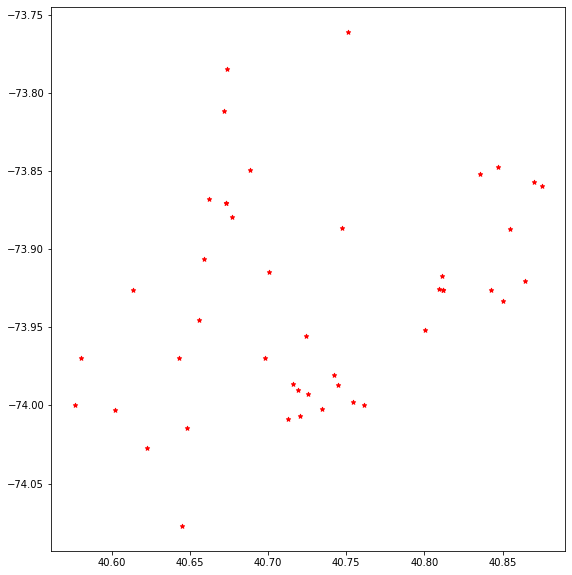

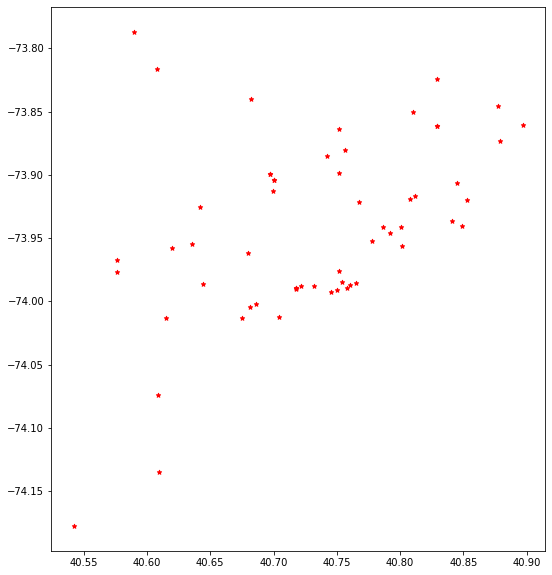

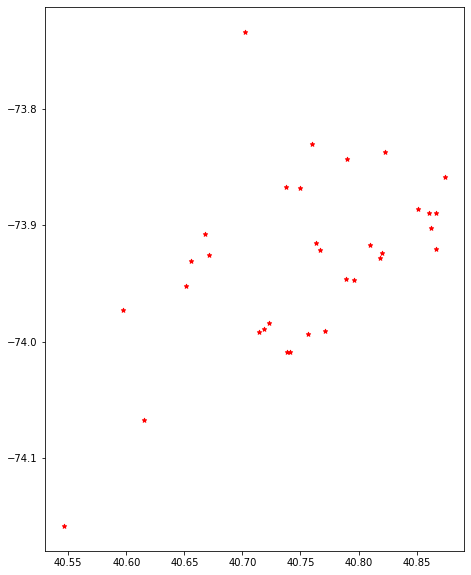

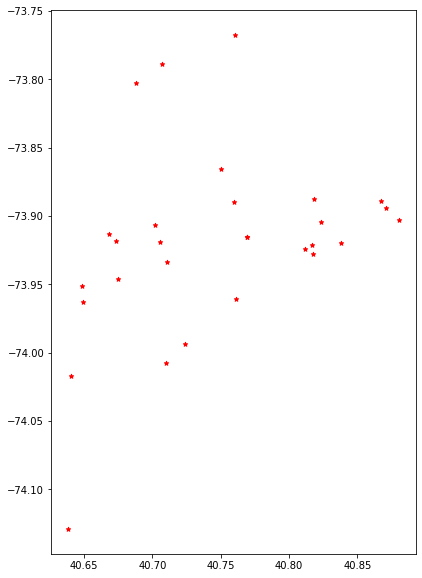

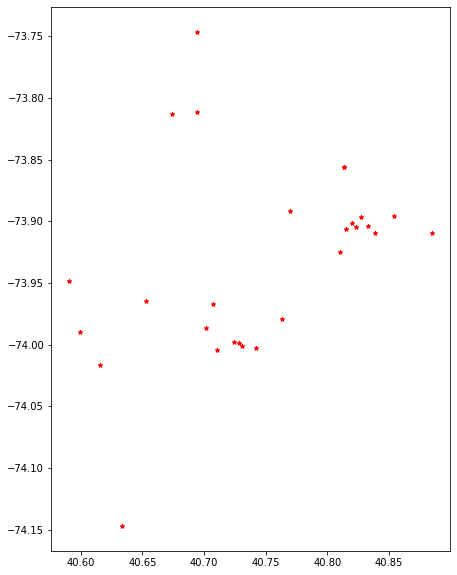

...

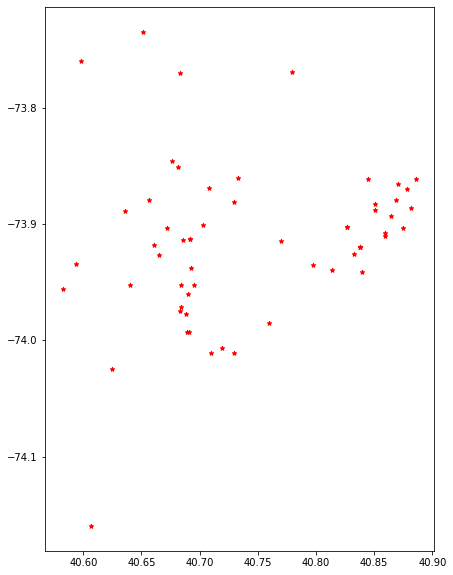

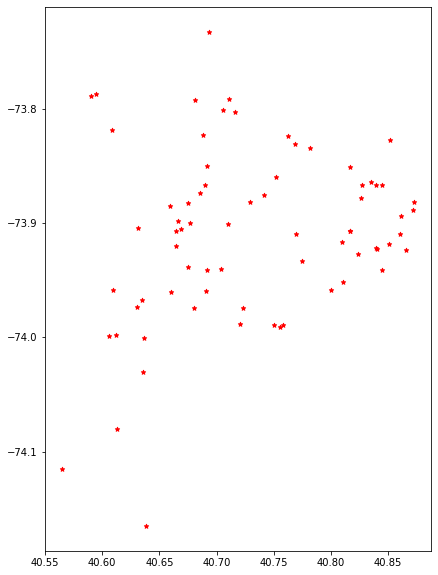

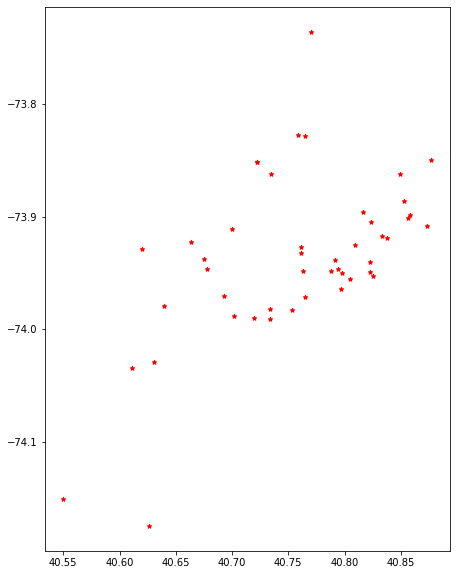

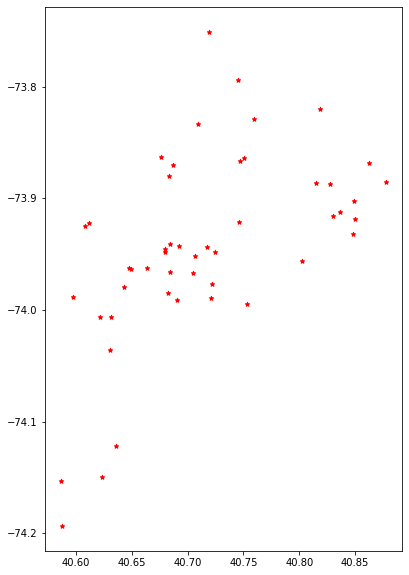

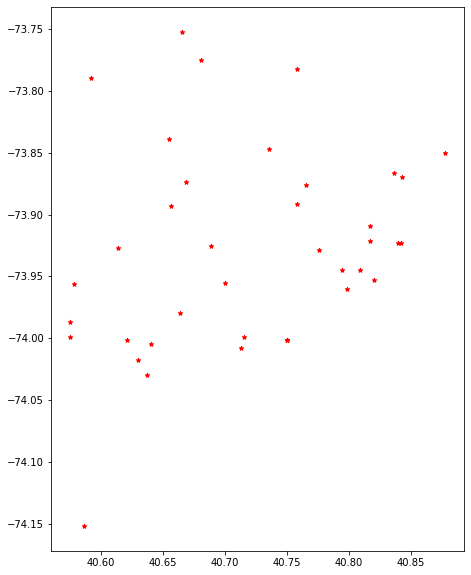

In [92]:
for element in final_array:
    fig,ax = plt.subplots(figsize = (10,10))
    g = element.plot(ax = ax, markersize = 20, color = 'red',marker = '*',label = 'NYC')
    plt.show()
